In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torchvision.transforms as transforms
from torchvision.models import resnet18
from sklearn.linear_model import Lasso
import torch.nn.functional as F
import os 
import torchvision
from torch.utils.data import DataLoader, Subset
from torchvision.datasets import ImageFolder
import torch.nn as nn
from torchvision.models import resnet18, ResNet18_Weights
from matplotlib import cm

*** ***

In [70]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Using device:", device)

Using device: cpu


In [71]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
transform = transforms.Compose([
    transforms.Resize(266),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    normalize
])                     

In [72]:
MODEL_PATH = r"..\..\Model Weights (Q1 & Q2)\resnet18-f37072fd.pth"  
model = resnet18(weights=None)   
state_dict = torch.load(MODEL_PATH, map_location=device)
model.load_state_dict(state_dict)
model.to(device)
model.eval()
for module in model.modules():
    if isinstance(module, nn.ReLU):
        module.inplace = False
print("Model loaded from", MODEL_PATH)

Model loaded from ..\..\Model Weights (Q1 & Q2)\resnet18-f37072fd.pth


In [73]:
DATASET_PATH = r"../tiny-imagenet-200/val"
if os.path.exists(DATASET_PATH):
    dataset = ImageFolder(root=DATASET_PATH , transform=transform)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)
    print(f"Dataset loaded with {len(dataset)} images.")
else:
    print("Dataset path not found. Please check the path.")

Dataset loaded with 10000 images.


*** ***

In [7]:
correct_samples = []
print("Searching for high-confidence samples...")
for image, _ in dataloader: 
    image = image.to(device)
    with torch.no_grad():
        output = model(image)
        probabilities = torch.softmax(output, dim=1)
        confidence, prediction = torch.max(probabilities, 1)
        if confidence.item() > 0.8:
            class_name = categories[prediction.item()]
            correct_samples.append((image, prediction, class_name))
            print(f"Sample {len(correct_samples)} found: {class_name} ({confidence.item():.2f}%)")       
    if len(correct_samples) == 5:
        break
print(f"Successfully collected {len(correct_samples)} valid samples.")


Searching for high-confidence samples...
Sample 1 found: thresher (0.81%)
Sample 2 found: barn spider (0.84%)
Sample 3 found: Egyptian cat (0.92%)
Sample 4 found: moving van (0.99%)
Sample 5 found: European fire salamander (0.84%)
Successfully collected 5 valid samples.


*** ***

In [74]:
def generate_saliency(model, image, target_class):
    input_image = image.clone().detach().requires_grad_(True)
    model_logit = model(input_image)
    score = model_logit[0, target_class]
    model.zero_grad()
    score.backward()
    saliency, _ = torch.max(input_image.grad.data.abs(), dim=1)
    saliency = saliency.squeeze().cpu().numpy()
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min()) 
    return saliency

In [75]:
MEAN = np.array([0.485, 0.456, 0.406])
STD = np.array([0.229, 0.224, 0.225])

In [76]:
def denormalize(image):
    original = image[0].detach().cpu().permute(1,2,0).numpy()
    original = STD * original + MEAN
    original = np.clip(original, 0, 1)
    return original

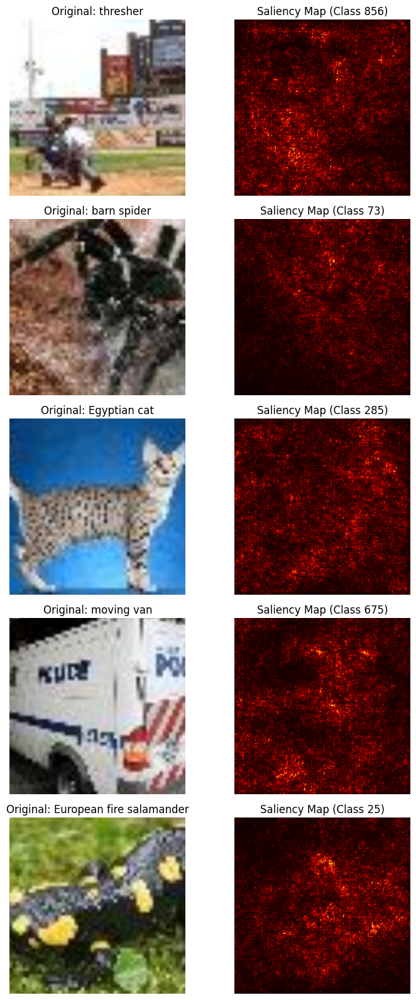

In [77]:
fig, axes = plt.subplots(5, 2, figsize=(8, 16))
for idx, (image, prediction, class_name) in enumerate(correct_samples):
    target_class = prediction.item()
    saliency = generate_saliency(model, image.clone(), target_class)
    original = denormalize(image)
    axes[idx,0].imshow(original)
    axes[idx,0].set_title(f"Original: {class_name}", fontsize=12)
    axes[idx,0].axis('off')
    im = axes[idx, 1].imshow(saliency, cmap='hot')
    axes[idx, 1].set_title(f"Saliency Map (Class {target_class})", fontsize=12)
    axes[idx, 1].axis('off')
plt.tight_layout()
plt.show()

*** ***

In [78]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None
        self.forward_hook = target_layer.register_forward_hook(self.save_activation)
        self.backward_hook = target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output.detach()

    def save_gradient(self, module, gradient_input, gradient_output):
        self.gradients = gradient_output[0].detach()

    def generate(self, image, target_class):
        output = self.model(image)
        self.model.zero_grad() 
        score = output[0, target_class]
        score.backward()
        gradients = self.gradients[0] 
        activations = self.activations[0] 
        weights = gradients.mean(dim=(1, 2), keepdim=True) 
        camgrad = torch.sum(weights * activations, dim=0) 
        camgrad = F.relu(camgrad)
        if camgrad.max() > 0:
            camgrad -= camgrad.min()
            camgrad /= camgrad.max()
        return camgrad.cpu().numpy()

    def remove_hooks(self):
        self.forward_hook.remove()
        self.backward_hook.remove()

In [79]:
target_layer = model.layer4[1].conv2
gradcam = GradCAM(model, target_layer)

*** ***

In [80]:
def overlay_heatmap(image, mask):
    color_map = plt.get_cmap('jet')
    heatmap = color_map(mask)
    heatmap = (heatmap[:, :, :3] * 255).astype(np.uint8)
    original_size = (image.shape[1], image.shape[0]) 
    heatmap_pil = Image.fromarray(heatmap).resize(original_size, resample=Image.BILINEAR)
    heatmap_numpy = np.array(heatmap_pil) / 255.0
    overlay = 0.5 * image + 0.5 * heatmap_numpy
    return np.clip(overlay, 0, 1)

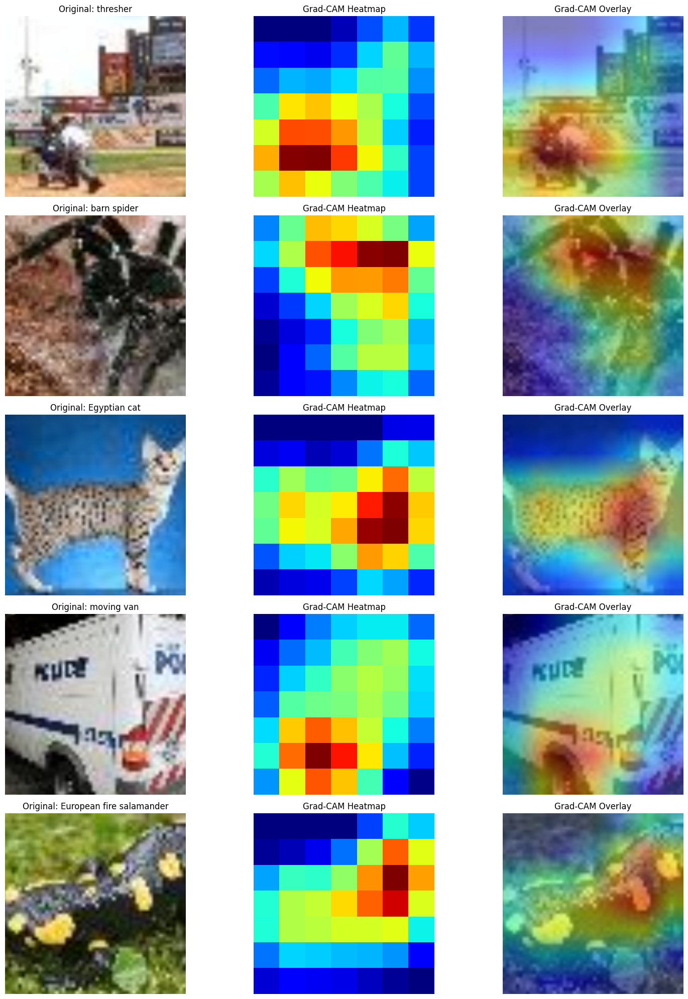

In [81]:
fig, axes = plt.subplots(5, 3, figsize=(16, 20)) 
for idx, (image, prediction_index, class_name) in enumerate(correct_samples):
    gradcam_plot = gradcam.generate(image, prediction_index.item())
    original = denormalize(image)
    gradcam_overlay = overlay_heatmap(original, gradcam_plot)
    axes[idx, 0].imshow(original)
    axes[idx, 0].set_title(f"Original: {class_name}", fontsize=12)
    axes[idx, 1].imshow(gradcam_plot, cmap='jet')
    axes[idx, 1].set_title("Grad-CAM Heatmap")
    axes[idx, 2].imshow(gradcam_overlay)
    axes[idx, 2].set_title("Grad-CAM Overlay")
    for ax in axes[idx]: 
        ax.axis('off')
plt.tight_layout()
plt.show()

*** ***

In [82]:
class Guided_backpropagation:
    def __init__(self, model):
        self.model = model
        self.gradients = None
        self.hooks = []

        def relu_backward_hook(module, gradient_input, gradient_output):
            return (torch.clamp(gradient_input[0], min=0.0),)

        def first_layer_hook(module, gradient_input, gradient_output):
            self.gradients = gradient_input[0]

        for module in self.model.modules():
            if isinstance(module, nn.ReLU):
                self.hooks.append(
                    module.register_full_backward_hook(relu_backward_hook)
                )
        first_layer = list(self.model.modules())[1]
        self.hooks.append(
            first_layer.register_full_backward_hook(first_layer_hook)
        )
        
    def generate(self, image, target_class):
        image.requires_grad_()
        output = self.model(image)
        self.model.zero_grad()
        loss = output[0, target_class]
        loss.backward()
        gradients = image.grad[0]
        gradients = gradients.cpu().numpy()
        gradients = np.transpose(gradients, (1,2,0))
        gradients -= gradients.min()
        gradients /= gradients.max()
        return gradients

In [83]:
guided_bp = Guided_backpropagation(model)

In [ ]:
def generate_occlusion_map(model, image, target_class, patch_size=32, stride=8):
    model.eval()
    height, width = image.shape[2], image.shape[3]
    with torch.no_grad():
        model_logit = model(image)
        baseline_score = F.softmax(model_logit, dim=1)[0, target_class].item()
    occlusion_map = np.zeros((height, width))
    for y in range(0, height - patch_size + 1, stride):
        for x in range(0, width - patch_size + 1, stride):
            patched_image = image.clone()
            patched_image[0, :, y:y+patch_size, x:x+patch_size] = 0.0
            with torch.no_grad():
                model_logit = model(patched_image)
                score = F.softmax(model_logit, dim=1)[0, target_class].item()
            occlusion_map[y:y+patch_size, x:x+patch_size] += (baseline_score - score)
    occlusion_map = (occlusion_map - occlusion_map.min()) / (occlusion_map.max() - occlusion_map.min() + 1e-8)
    return occlusion_map


Sample 1/5
Top-2 predictions for this image:
1. class id = 856, name = thresher, probability = 0.8067
2. class id = 210, name = German short-haired pointer, probability = 0.0432


C:\Users\Acer\AppData\Local\Temp\ipykernel_436\3550008436.py:20: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
  score.backward()


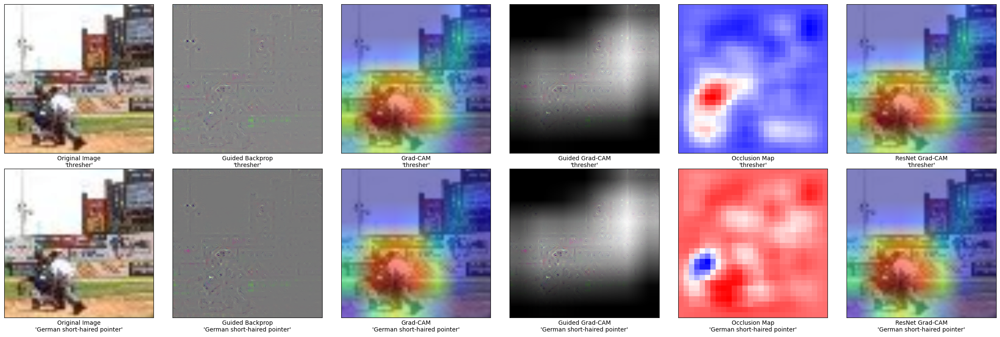


Sample 2/5
Top-2 predictions for this image:
1. class id = 73, name = barn spider, probability = 0.8443
2. class id = 76, name = tarantula, probability = 0.0987


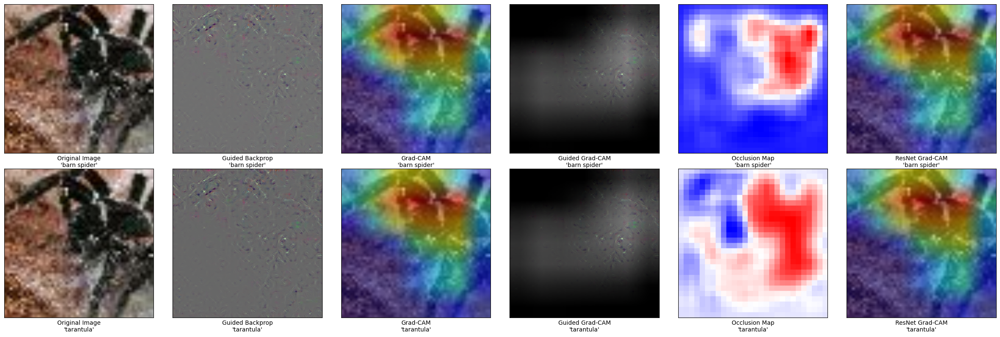


Sample 3/5
Top-2 predictions for this image:
1. class id = 285, name = Egyptian cat, probability = 0.9173
2. class id = 293, name = cheetah, probability = 0.0407


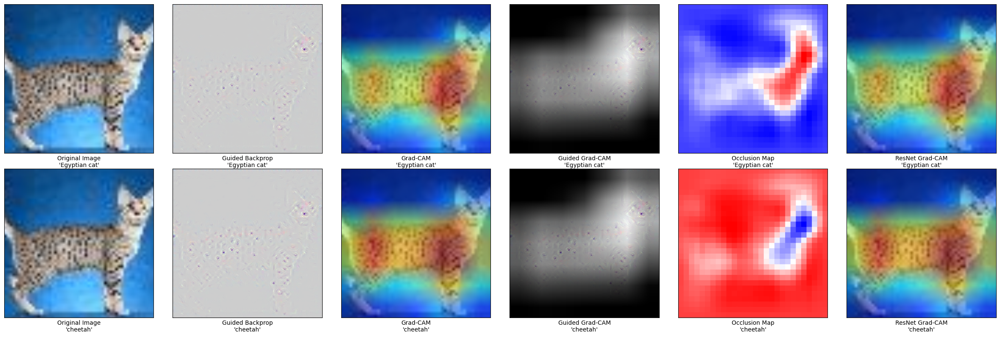


Sample 4/5
Top-2 predictions for this image:
1. class id = 675, name = moving van, probability = 0.9868
2. class id = 867, name = trailer truck, probability = 0.0057


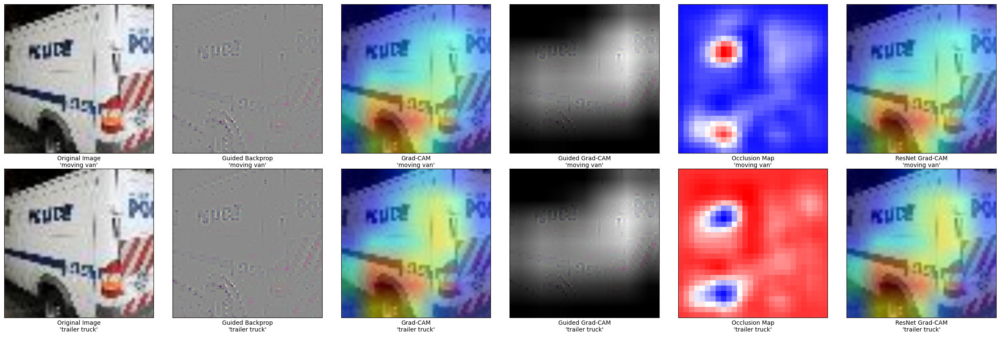


Sample 5/5
Top-2 predictions for this image:
1. class id = 25, name = European fire salamander, probability = 0.8402
2. class id = 28, name = spotted salamander, probability = 0.1489


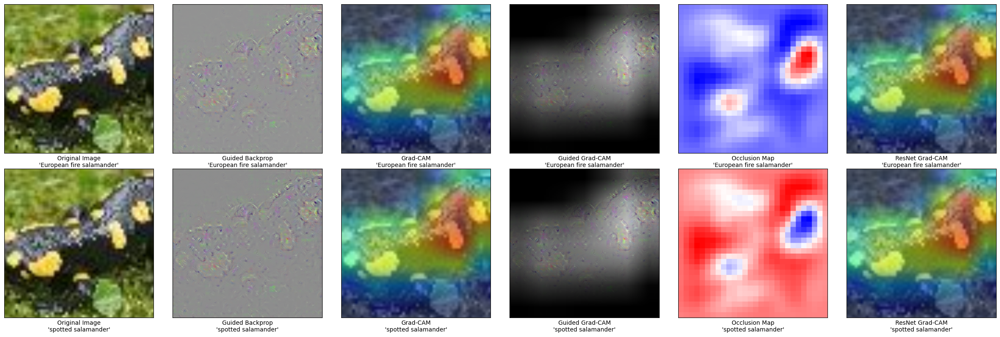

In [85]:
titles = [
            "Original Image",
            "Guided Backprop",
            "Grad-CAM",
            "Guided Grad-CAM",
            "Occlusion Map",
            "ResNet Grad-CAM"
        ]

for i, sample in enumerate(correct_samples):
    image, label, prediction = sample
    image = image.to(device)
    with torch.no_grad():
        model_logits = model(image)
        probabilities = torch.softmax(model_logits, dim=1)
        top_probabilities, top_classes = torch.topk(probabilities, k=2, dim=1)

    print(f"\nSample {i+1}/{len(correct_samples)}")
    print("Top-2 predictions for this image:")
    for rank, (cls, probabilities) in enumerate(zip(top_classes[0], top_probabilities[0]), start=1):
        print(f"{rank}. class id = {cls.item()}, name = {categories[cls.item()]}, probability = {probabilities.item():.4f}")

    target_classes = top_classes[0][:2].tolist()
    target_names = [categories[c] for c in target_classes]
    fig, axes = plt.subplots(2, 6, figsize=(24, 8))
    for row, target_class in enumerate(target_classes):
        original = denormalize(image)
        g_cam = gradcam.generate(image, target_class)
        gb = guided_bp.generate(image.clone().detach(), target_class)
        occ_map = generate_occlusion_map(model, image.clone().detach(), target_class)
        g_cam_overlay = overlay_heatmap(original, g_cam)
        if gb.shape[0] == 3:
            gb_display = gb.transpose(1, 2, 0)
        else:
            gb_display = gb
        guided_g_cam = gb_display * g_cam_resized[..., np.newaxis]
        guided_g_cam = (guided_g_cam - guided_g_cam.min()) / (guided_g_cam.max() - guided_g_cam.min() + 1e-8)
        occ_heatmap = cm.bwr(occ_map)[:, :, :3]
        cols = [original, gb_display, g_cam_overlay, guided_g_cam, occ_heatmap, g_cam_overlay]
        for col, data in enumerate(cols):
            ax = axes[row, col]
            ax.imshow(data)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xlabel(f"{titles[col]}\n'{target_names[row]}'", fontsize=10)
    plt.tight_layout()
    plt.show()

*** ***

In [ ]:
class FinerGradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.feature_maps = None
        self.gradients = None
        self.hooks = []
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.feature_maps = output
        def backward_hook(module, gradient_input, gradient_output):
            self.gradients = gradient_output[0]
        self.hooks.append(self.target_layer.register_forward_hook(forward_hook))
        self.hooks.append(self.target_layer.register_full_backward_hook(backward_hook))

    def generate(self, image_tensor, target_class, gamma=0.8, d=3):
        image_tensor = image_tensor.clone().detach().requires_grad_(True)
        self.model.zero_grad()
        if image_tensor.dim() == 3:
            image_tensor = image_tensor.unsqueeze(0)
        output = self.model(image_tensor)
        sorted_indices = torch.argsort(output, descending=True)[0]
        similar_classes = [idx.item() for idx in sorted_indices if idx.item() != target_class][:d]
        objective = output[0, target_class]
        for d_idx in similar_classes:
            objective -= (gamma / d) * output[0, d_idx]
        objective.backward()
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * self.feature_maps, dim=1).squeeze(0)
        cam = F.relu(cam)
        cam -= cam.min()
        cam /= (cam.max() + 1e-8)
        return cam.detach().cpu().numpy(), similar_classes

    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()

In [52]:
finer_cam_engine = FinerGradCAM(model, model.layer4)

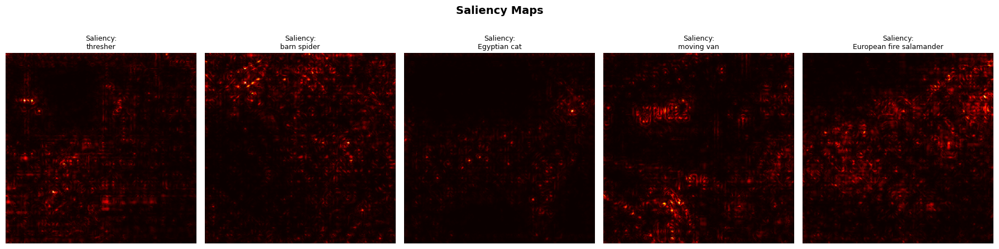

In [ ]:
plt.figure(figsize=(18, 5))
for i, (image, prediction, name) in enumerate(correct_samples):
    target_class = prediction.item()
    saliency = generate_saliency(model, image_tensor, target_class)
    original_image = denormalize(image.cpu())
    plt.subplot(1, 5, i + 1)
    plt.imshow(saliency, cmap='hot')
    plt.title(f"Saliency:\n{name.split(',')[0]}", fontsize=9)
    plt.axis('off')
plt.suptitle("Saliency Maps", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

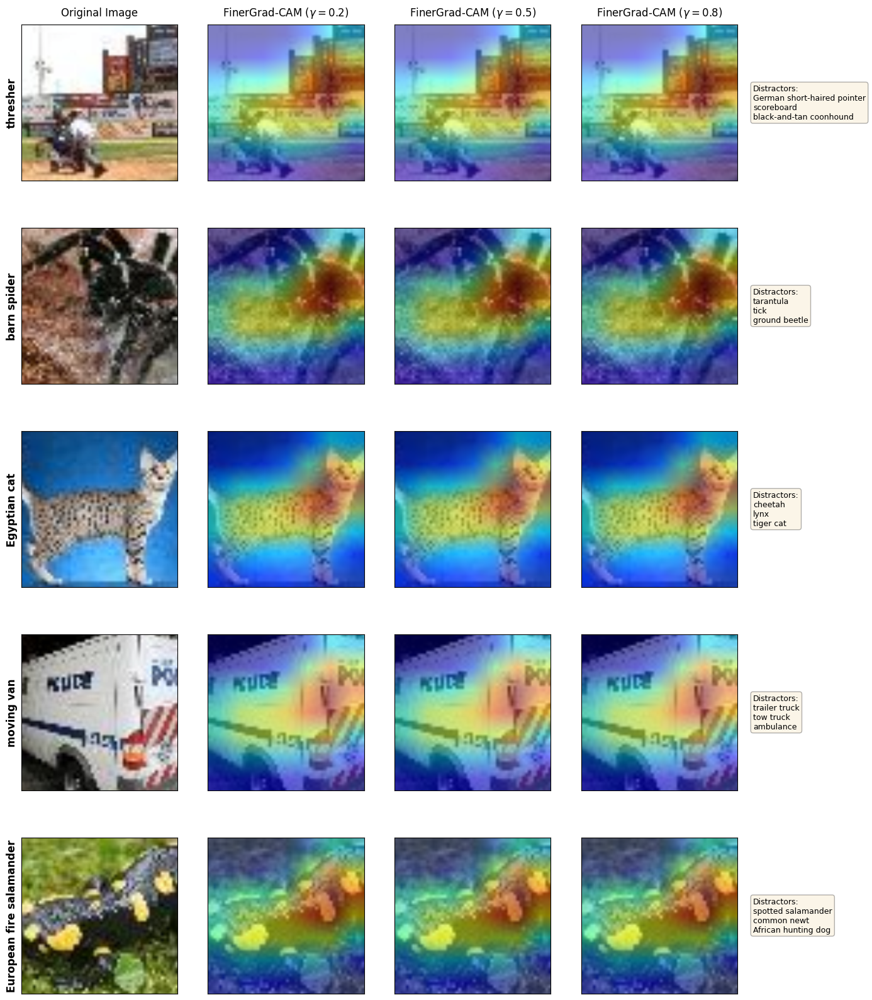

In [86]:
gammas = [0.2, 0.5, 0.8]
fig, axes = plt.subplots(5, 4, figsize=(16, 4 * n_samples))
for i, (image_tensor, prediction, name) in enumerate(correct_samples):
    target_class = prediction.item()
    original_image = denormalize(image_tensor.cpu())
    axes[i, 0].imshow(original_image)
    if i == 0: axes[i, 0].set_title("Original Image", fontsize=12, pad=10)
    axes[i, 0].set_ylabel(name.split(',')[0], fontsize=12, fontweight='bold') 
    axes[i, 0].set_xticks([]); axes[i, 0].set_yticks([])
    similar_names_str = ""
    for g_idx, g_val in enumerate(gammas):
        cam, similar_ids = finer_cam_engine.generate(
            image_tensor, 
            target_class=target_class, 
            gamma=g_val, 
            d=3
        )
        result_image = overlay_heatmap(original_image, cam)
        ax = axes[i, g_idx + 1]
        ax.imshow(result_image)
        if i == 0:
            ax.set_title(fr"FinerGrad-CAM ($\gamma={g_val}$)", fontsize=12, pad=10)
        ax.set_xticks([]); ax.set_yticks([])
        if g_idx == 1: 
            similar_names = [categories[idx].split(',')[0] for idx in similar_ids]
            similar_names_str = "\n".join(similar_names)
    axes[i, 3].text(1.1, 0.5, f"Distractors:\n{similar_names_str}", 
                    transform=axes[i, 3].transAxes, 
                    fontsize=9, va='center', ha='left',
                    bbox=dict(boxstyle="round", facecolor='wheat', alpha=0.3))
plt.subplots_adjust(wspace=0.1, hspace=0.3, right=0.85) 
plt.show()


*** ***

C:\Users\Acer\AppData\Local\Temp\ipykernel_436\3550008436.py:20: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
  score.backward()


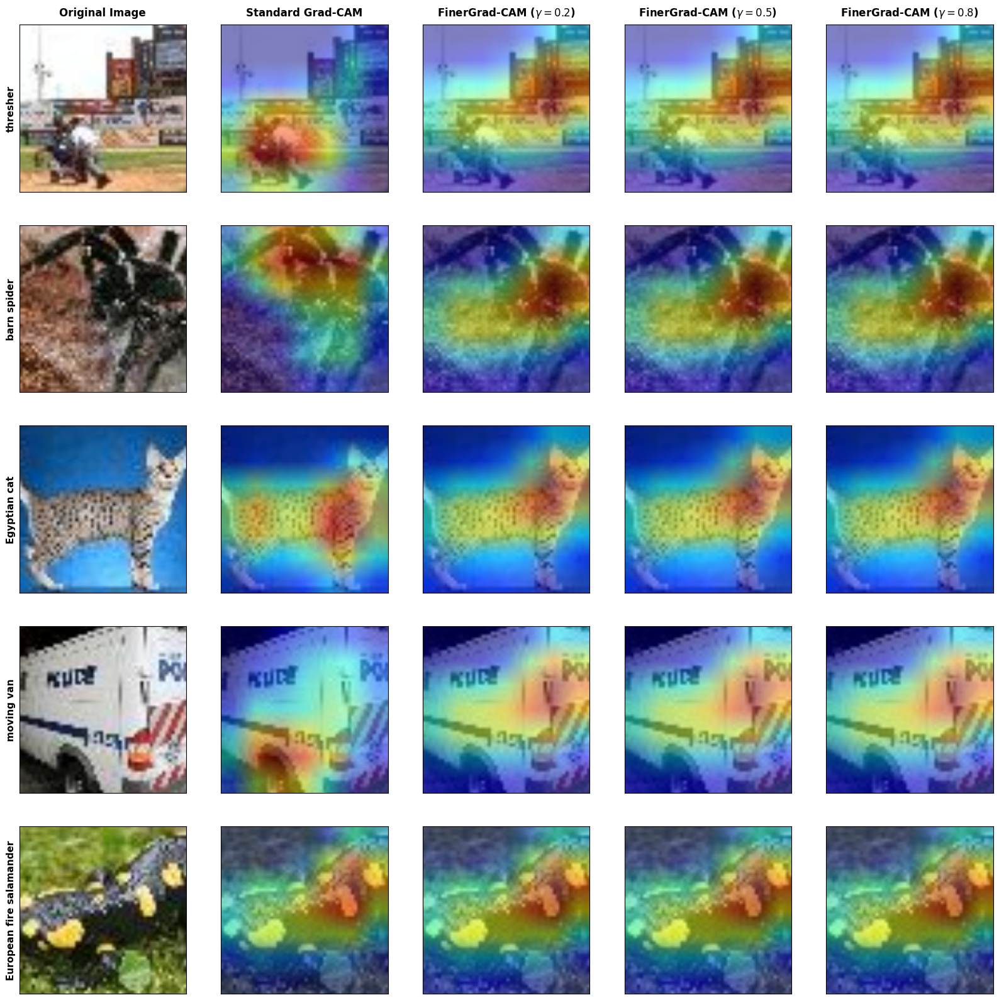

In [67]:
fig, axes = plt.subplots(5, 5, figsize=(20, 4 * 5))
for i, (image_tensor, prediction, name) in enumerate(correct_samples):
    target_class = prediction.item()
    original_image = denormalize(image_tensor.cpu())
    short_name = name.split(',')[0]
    axes[i, 0].imshow(original_image)
    if i == 0: 
        axes[i, 0].set_title("Original Image", fontsize=12, pad=10, fontweight='bold')
    axes[i, 0].set_ylabel(short_name, fontsize=11, fontweight='bold')
    axes[i, 0].set_xticks([]); axes[i, 0].set_yticks([])
    standard_mask = gradcam.generate(image_tensor, target_class)
    standard_overlay = overlay_heatmap(original_image, standard_mask)
    axes[i, 1].imshow(standard_overlay)
    if i == 0: 
        axes[i, 1].set_title("Standard Grad-CAM", fontsize=12, pad=10, fontweight='bold')
    axes[i, 1].set_xticks([]); axes[i, 1].set_yticks([])
    for g_idx, g_val in enumerate(gammas):
        finer_mask, similar_ids = finer_cam_engine.generate(
            image_tensor, 
            target_class=target_class, 
            gamma=g_val, 
            d=3
        )
        finer_overlay = overlay_heatmap(original_image, finer_mask)
        ax = axes[i, g_idx + 2]
        ax.imshow(finer_overlay)
        if i == 0:
            ax.set_title(fr"FinerGrad-CAM ($\gamma={g_val}$)", fontsize=12, pad=10, fontweight='bold')      
        ax.set_xticks([]); ax.set_yticks([])
plt.show()
finer_cam_engine.remove_hooks()